In [1]:
import os 
import numpy as np
np.seterr(divide = "ignore")
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
path = os.getcwd()
dataTrain = pd.read_csv(os.path.join(path, "DS1/app_train.csv"))
dataTest = pd.read_csv(os.path.join(path, "DS1/app_test.csv"))

In [3]:
dataTrain.rename({"Unnamed: 0":"a"}, axis="columns", inplace=True)
dataTrain.drop(["a"], axis=1, inplace=True)

dataTest.rename({"Unnamed: 0":"a"}, axis="columns", inplace=True)
dataTest.drop(["a"], axis=1, inplace=True)

In [4]:
# Separating data with type "object"
categDataTrain = dataTrain.select_dtypes(include="object")
# Get the names of categorically features
categFeatures = categDataTrain.columns

In [5]:
from sklearn.preprocessing import LabelEncoder

def replaceCategValues(data, categFeatures):
    lb = LabelEncoder()
    for feature in categFeatures:
        data[feature] = lb.fit_transform(data[feature])
    return data

In [6]:
dataTrain = replaceCategValues(dataTrain, categFeatures)

dataTest = replaceCategValues(dataTest, categFeatures)

In [7]:
dataTrain = dataTrain.dropna()

dataTest = dataTest.dropna()

# drop 25 percent of the dataTrain data
# memory's not enough if using full dataTrain during AHC
frac_DataTrain = dataTrain.sample(frac=.75)
frac_DataTrain.shape

(16342, 23)

In [8]:
data = pd.concat([frac_DataTrain, dataTest], ignore_index=True)

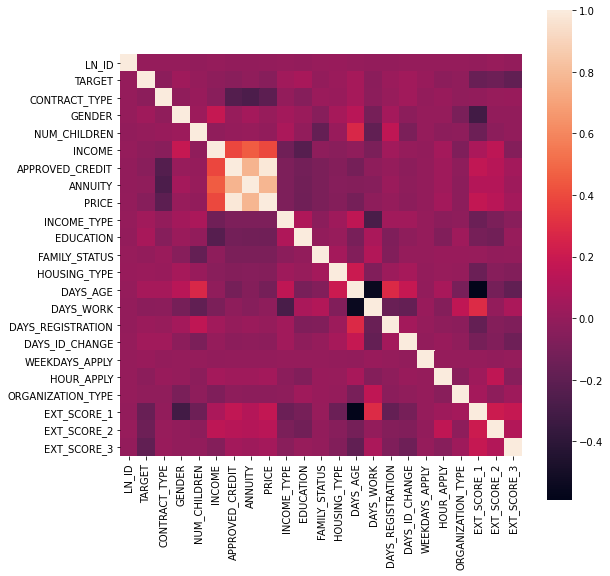

In [9]:
import seaborn as sns

%matplotlib inline
f,ax = plt.subplots(1, 1, figsize=(9, 9))
sns.heatmap(data.corr(), square=True)

In [10]:
y_data = data.TARGET
X_data = data.drop(["LN_ID", "TARGET"], axis=1)

In [11]:
from sklearn.preprocessing import Normalizer

scaler = Normalizer()
scaler.fit(X_data)
scaled_X = scaler.transform(X_data)
scaled_X = pd.DataFrame(scaled_X, columns=X_data.columns)

In [12]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
# from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

In [13]:
algorithms = []
n_cluster = 3
algorithms.append(("kmeans", KMeans(n_clusters=n_cluster)))
algorithms.append(("AHC", AgglomerativeClustering(n_clusters=n_cluster)))
# algorithms.append(("DBSCAN", DBSCAN()))
algorithms.append(("GMM", GaussianMixture(n_components=n_cluster)))

In [14]:
clusterOutput = pd.DataFrame()
clusterOutput["LN_ID"] = data.LN_ID
for name, algo in algorithms:
    cluster = algo.fit_predict(scaled_X)
    clusterOutput[name] = cluster
clusterOutput

,LN_ID,kmeans,AHC,GMM
0,384050,0,2,0
1,127796,0,2,0
2,192730,0,2,0
3,367730,1,0,2
4,371691,0,2,0
...,...,...,...,...
21623,118761,1,0,2
21624,248296,0,0,2
21625,443980,0,0,2
21626,119056,0,2,2


In [15]:
for name, algo in algorithms:
    print(clusterOutput[name].value_counts())
    print("=============")

0    15468
1     4691
2     1469
Name: kmeans, dtype: int64
2    12356
0     7136
1     2136
Name: AHC, dtype: int64
0    12893
2     6598
1     2137
Name: GMM, dtype: int64


In [16]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(scaled_X)
pcaX_train = pca.transform(scaled_X)

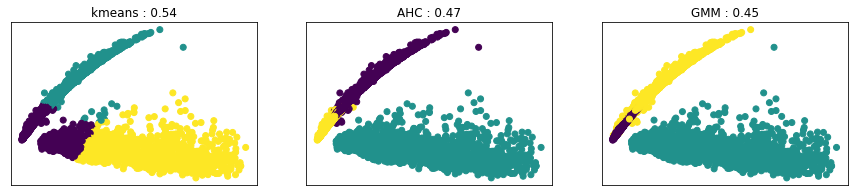

In [17]:
from sklearn.metrics.cluster import silhouette_score

silhouettes = []

fig, axes = plt.subplots(1, 3, figsize=(15, 3), subplot_kw={"xticks": (), "yticks": ()})

for ax, (name, algo) in zip(axes[0:], algorithms):
    clusters = clusterOutput[name]
    silhouette = silhouette_score(scaled_X, clusters)
    silhouettes.append((name, silhouette))

    ax.scatter(pcaX_train[:, 0], pcaX_train[:, 1], c=clusters)
    ax.set_title("{} : {:.2f}".format(name, silhouette))

In [18]:
# cluster data with parent data (dataTrain, dataTest)
bestAlgo = max(silhouettes)[0]
rowFracDataTrain = frac_DataTrain.shape[0]
rowDataTest = dataTest.shape[0]

dataTrain_ClusterLbl = clusterOutput[["LN_ID", bestAlgo]].head(rowFracDataTrain)
dataTrain_Final = frac_DataTrain.merge(dataTrain_ClusterLbl, how="left", on="LN_ID")

dataTest_ClusterLbl = clusterOutput[["LN_ID", bestAlgo]].tail(rowDataTest)
dataTest_Final = dataTest.merge(dataTest_ClusterLbl, how="left", on="LN_ID")

In [19]:
dataTrain_Final

,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,INCOME_TYPE,...,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,WEEKDAYS_APPLY,HOUR_APPLY,ORGANIZATION_TYPE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,kmeans
0,384050,0,0,1,0,202500.0,1024740.0,52452.0,900000.0,6,...,-536,-3833.0,-1953,2,9,5,0.317214,0.416620,0.303146,0
1,127796,0,0,1,1,267750.0,916470.0,25200.0,765000.0,1,...,-4274,-3614.0,-737,1,14,5,0.394873,0.669720,0.399676,0
2,192730,0,0,0,1,157500.0,816660.0,26473.5,585000.0,6,...,-2959,-6397.0,-2704,6,12,52,0.700868,0.510612,0.771362,0
3,367730,0,0,0,0,270000.0,264888.0,31563.0,234000.0,6,...,-2887,-1952.0,-2411,1,13,26,0.844270,0.625012,0.538863,1
4,371691,0,0,0,0,112500.0,835380.0,35523.0,675000.0,6,...,-4526,-15.0,-1851,0,14,5,0.596417,0.591366,0.649620,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16337,424591,0,0,0,0,247500.0,1837629.0,48604.5,1642500.0,1,...,-1669,-9239.0,-3270,4,11,43,0.658630,0.746524,0.687933,0
16338,362604,0,0,0,0,67500.0,52767.0,5269.5,49500.0,2,...,365243,-12133.0,-4074,6,9,33,0.756543,0.323695,0.312365,2
16339,413138,0,0,0,2,67500.0,315000.0,16213.5,315000.0,3,...,-5472,-200.0,-4443,3,10,40,0.739608,0.382488,0.513694,0
16340,232221,0,1,0,0,144000.0,337500.0,16875.0,337500.0,3,...,-671,-3683.0,-1486,0,8,11,0.733847,0.726614,0.465069,0


In [20]:
dataTest_Final

,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,INCOME_TYPE,...,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,WEEKDAYS_APPLY,HOUR_APPLY,ORGANIZATION_TYPE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,kmeans
0,180205,0,0,0,1,90000.0,247500.0,8887.5,247500.0,4,...,-2826,-8226.0,-1930,2,12,43,0.814700,0.686312,0.758393,0
1,357381,0,0,1,2,112500.0,506889.0,24781.5,418500.0,4,...,-926,-916.0,-4048,4,13,34,0.399219,0.266520,0.058826,0
2,271229,0,0,1,0,216000.0,450000.0,21888.0,450000.0,4,...,-577,-4640.0,-2035,1,14,5,0.368452,0.610483,0.392774,0
3,374711,0,0,0,0,58500.0,135000.0,7321.5,135000.0,4,...,-3100,-3232.0,-3576,5,10,41,0.501097,0.067371,0.199771,0
4,146009,0,0,0,0,112500.0,665892.0,19210.5,477000.0,1,...,365243,-741.0,-3743,1,13,33,0.699160,0.673492,0.510090,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5281,118761,0,0,1,0,315000.0,225000.0,23755.5,225000.0,0,...,-983,-85.0,-2975,6,10,56,0.184000,0.470237,0.468660,1
5282,248296,0,0,0,0,126000.0,263686.5,28525.5,238500.0,0,...,-438,-8589.0,-1272,1,12,13,0.504087,0.551037,0.273565,0
5283,443980,0,1,1,0,157500.0,337500.0,16875.0,337500.0,4,...,-3152,-4165.0,-4851,6,11,41,0.887527,0.727850,0.590233,0
5284,119056,0,1,0,0,45000.0,135000.0,6750.0,135000.0,4,...,-113,-7059.0,-2864,2,10,11,0.770063,0.583092,0.709189,0
